# Описание проекта

## Описание проекта
Мы работаем в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”). \
Наши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. mountains and clouds. \
Отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое: A man is crossing a mountain pass on a metal bridge. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим.
Мне поручено разработать демонстрационную версию поиска изображений по запросу.
Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.

На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

## Юридические ограничения
В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет. \
В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер: This image is unavailable in your country in compliance with local laws. \
Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.


## Описание данных
В файле train_dataset.csv находится информация, необходимая для обучения:
1. имя файла изображения
2. идентификатор описания и текст описания.

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

1. В папке train_images содержатся изображения для тренировки модели.
2. В файле CrowdAnnotations.tsv  — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
    * Имя файла изображения.
    * Идентификатор описания.
    * Доля людей, подтвердивших, что описание соответствует изображению.
    * Количество человек, подтвердивших, что описание соответствует изображению.
    * Количество человек, подтвердивших, что описание не соответствует изображению.
3. В файле ExpertAnnotations.tsv  — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
    * Имя файла изображения.
    * Идентификатор описания.
    * 3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует
* 3 — запрос и текст соответствуют с точностью до некоторых деталей
* 4 — запрос и текст соответствуют полностью.      
4. В файле test_queries.csv находится информация, необходимая для тестирования:
    * идентификатор запроса
    * текст запроса и релевантное изображение.
Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
В папке test_images содержатся изображения для тестирования модели.




## Импорты

In [1]:
!pip install -q --upgrade keras-nlp tensorflow
!pip install -q sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 3.1 MB/s eta 0:00:000:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.10.0 requires tensorflow==2.17.0, but you have tensorflow 2.17.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 8.0 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle

import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords', '/kaggle/working/stopwords')
nltk.download('punkt', '/kaggle/working/punkt')
nltk.download('wordnet', '/kaggle/working/wordnet')
nltk.download('omw-1.4', '/kaggle/working/omw-1.4')
!unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

from PIL import Image

from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp

from tqdm import notebook

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

[nltk_data] Downloading package stopwords to
[nltk_data]     /kaggle/working/stopwords...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /kaggle/working/punkt...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /kaggle/working/wordnet...
[nltk_data] Downloading package omw-1.4 to /kaggle/working/omw-1.4...
Archive:  /usr/share/nltk_data/corpora/wordnet.zip
   creating: /usr/share/nltk_data/corpora/wordnet/
  inflating: /usr/share/nltk_data/corpora/wordnet/lexnames  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adv  
  inflating: /usr/share/nltk_data/corpora/wordnet/adv.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/cntlist.rev  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adj  
  inflating: /

In [3]:
PATH = '/kaggle/input/with-sense/to_upload'
SEED = 1940
BLOCK = ['teenage',
         'baby',
         'child',
         'teenager',
         'girl',
         'boy',
         'kid',
         'baby',
         'boy',
         'daughter',
         'girl',
         'juvenile',
         'kid',
         'minor',
         'offspring',
         'son',
         'youngster',
         'youth',
         'babe',
         'bairn',
         'bambino',
         'brat',
         'chick',
         'cub',
         'imp',
         'innocent',
         'lamb',
         'moppet',
         'nestling',
         'nipper',
         'shaver',
         'sprout',
         'squirt',
         'stripling',
         'suckling',
         'tadpole',
         'tot',
         'tyke',
         'urchin',
         'anklebiter',
         'gamin',
         'gamine',
         'kiddie',
         'pubescent',
         'small fry',
         'young one']

np.random.seed(SEED)
tf.random.set_seed(SEED)

# Исследовательский анализ данных
В наборе данных представлены оценки соответствия изображения и текста, полученные от экспертов и от краудсорсеров.

В файле с экспертными оценками для каждой пары «изображение-текст» указаны оценки трёх специалистов. Задача — свести эти три значения к одному итоговому. Один из самых простых подходов — использовать правило большинства: если 2 или 3 эксперта выбрали одинаковый вариант, именно он становится итоговым. Если же все три оценки различны (к примеру, 1, 4 и 2), то такую пару «изображение-текст» можно исключить из набора данных.

Файл с краудсорсинговыми оценками содержит следующую информацию:

* Долю респондентов, которые считают, что текст соответствует изображению.
* Общее число участников, подтвердивших соответствие.
* Общее число участников, указавших на несоответствие.

Проанализировав данные экспертов и краудсорсеров, можно выбрать одну из этих групп оценок или объединить их по определённому правилу. Например, можно присвоить оценке экспертов вес 0.6, а оценке краудсорсеров — 0.4, и вычислить итоговую оценку на этой основе.

В итоге модель должна выдавать вероятность того, что текст соответствует изображению, а значит итоговые значения должны находиться в диапазоне от 0 до 1.

In [4]:
def read_df(path=PATH) -> pd.DataFrame:


    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))#.sample(frac=0.1)
    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')

    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

Проверим содержание данных

In [5]:
display(df_train.head(), df_crowd.head(), df_expert.head(), df_queries.head(), df_images.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [6]:
print('Количество уникальных фото в выборке для обучения:', len(df_train['image'].unique()))
print('Количество уникальных фото в выборке для тестирования:', len(df_queries['image'].unique()))

Количество уникальных фото в выборке для обучения: 1000
Количество уникальных фото в выборке для тестирования: 100


In [7]:
print('Количество уникальных запросов в выборке для тестирования:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов в выборке для тестирования: 500


In [8]:
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', df_expert.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', df_crowd.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст оцененных людьми: 47830


Рассмотрим среднее распредлеение оценок экспертов

<Axes: >

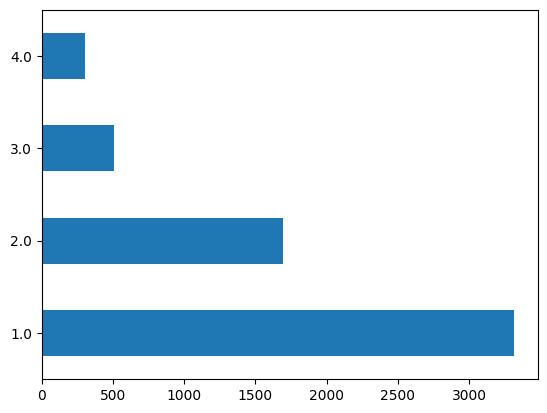

In [9]:
round(
    (
        df_expert.drop_duplicates()['first'] +
        df_expert.drop_duplicates()['second'] +
        df_expert.drop_duplicates()['third']
    ) / 3
    ).value_counts().plot(kind='barh')

Проверим распределение оценок данных с помощью краудсорсинга

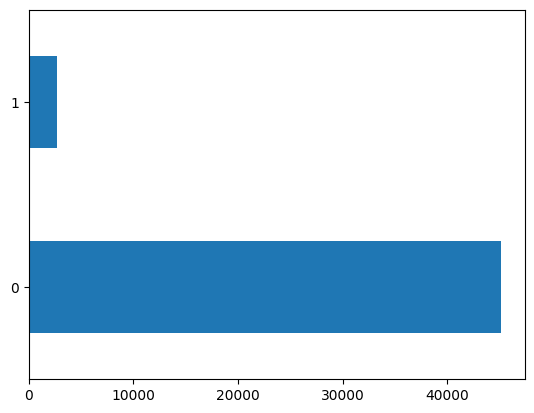

In [10]:
df_crowd.apply(lambda x: 1 if x.count_pos > x.count_neg else 0, axis=1).value_counts().plot(kind='barh');

Проверка идентичности текстовых описаний train и test

In [11]:
print('Уникальных текстовых описаний на train:', len(set(df_train['query_text'])))
print('Уникальных текстовых описаний на test:', len(set(df_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний на train: 977
Уникальных текстовых описаний на test: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


Проверка пересечений картинок между тестовым и тренировочным наборами

In [12]:
print('Уникальных картинок на train:', len(set(df_train['image'])))
print('Уникальных картинок на test:', len(set(df_queries['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(df_train['image']) & set(df_queries['image'])))

Уникальных картинок на train: 1000
Уникальных картинок на test: 100
Уникальных картинок которые есть в обоих наборах: 0


Просмотр примера предоставленных изображений

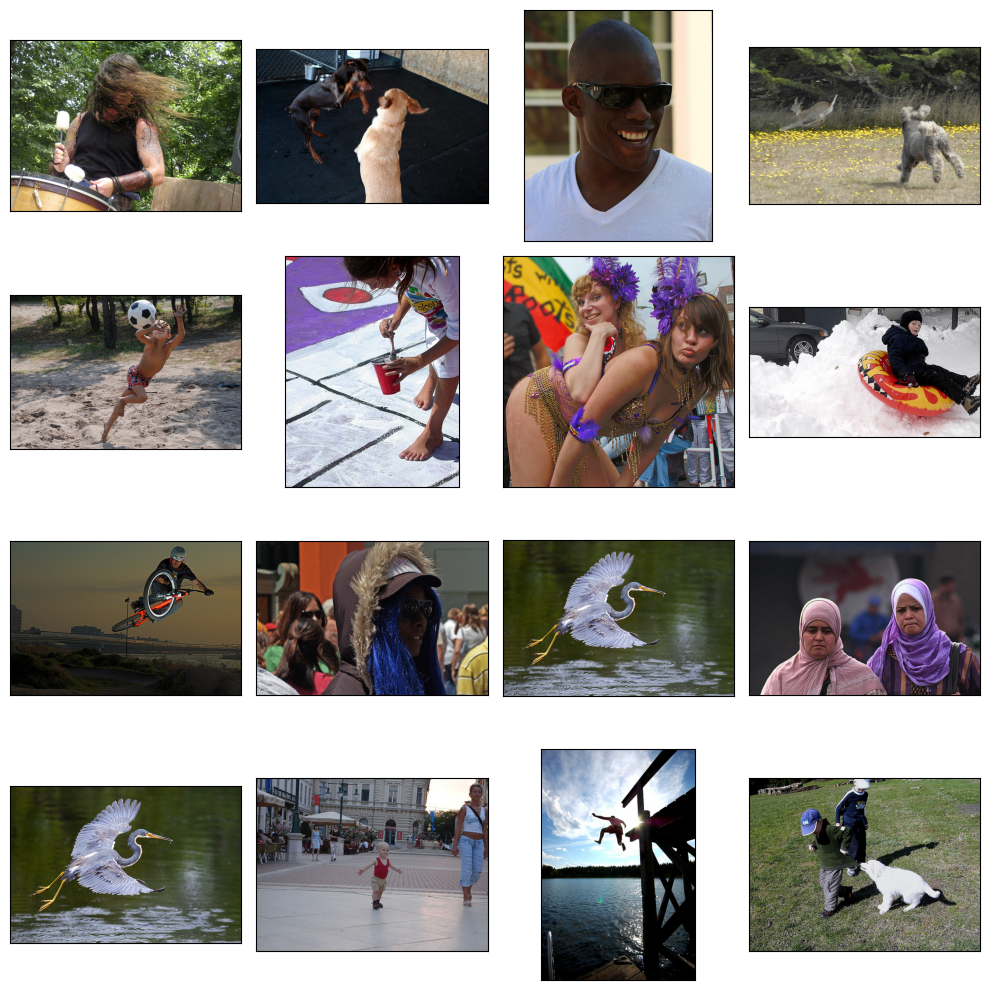

In [13]:
samples_train = list(df_train['image'].sample(8))
samples_test = list(df_queries['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

## Выводы

Заказчиком предоставлено 100 изображений для обучения и 1000 для тестирования, а также предварительно подготовленные файлы, которые содержат пары «картинка-описание» для обучающего и тестового наборов данных.

Для обучающей выборки доступны оценки соответствия изображения и текста, выполненные экспертами (всего 5822 оценки), а также результаты, полученные на краудсорсинговой платформе (47830 оценок). Некоторые из краудсорсерских оценок совпадают с экспертными. Основная часть оценок в обеих группах указывает на слабое соответствие описаний к изображениям, что потенциально может негативно повлиять на качество обучаемой модели.

Пересечений между наборами данных для обучения и тестирования не выявлено.

В обучающем наборе использовался только второй вариант описания для каждой картинки, тогда как в тестовом наборе для каждого изображения присутствует по пять различных описаний.




## Работа с оценками

Давайте определим функцию, которая будет агрегировать оценки экспертов:

- Если все три оценки различны, мы вычислим их среднее значение, а затем нормируем полученный результат в диапазоне [0,1].

- Если же среди оценок есть повторяющиеся значения (то есть большинство «голосует» за определённую оценку), то итоговой становится именно эта оценка

In [14]:
def expert_aggregate(row) -> object:


    if row['first'] != row['second'] != row['third']: #если оценки разные усредняем
        row['expert_score'] = (row['first'] + row['second'] + row['third'] - 3) / 3 / 3

    else: #если есть одинаковые оценки - аггрегируем голосованием
        row['expert_score'] = (max(set([row['first'], row['second'], row['third']]), key = [row['first'], row['second'], row['third']].count) - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

In [15]:
df_expert

,image,query_id,first,second,third,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000
...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.000000
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.000000
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.000000
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.000000


Из 2329 пар «картинка-текст» имеются как экспертные, так и краудсорсинговые оценки. Для объединения этих данных мы используем внешнее соединение (outer join). Это позволит получить три группы: пары с только экспертными оценками (более надёжными), пары с только краудсорсерскими оценками и пары, где представлены оба типа оценок.

Далее мы проведём процедуру интеграции этих оценок.

In [16]:
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row) -> object:


    if np.isnan(row['expert_score']):
        row['score'] = row['share_pos']
    elif np.isnan(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3

    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

In [17]:
df_scores

,image,query_id,first,second,third,expert_score,share_pos,count_pos,count_neg,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0,1.0,1.0,0.000000,0.000000,0.0,3.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0,1.0,2.0,0.000000,0.000000,0.0,3.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0,1.0,2.0,0.000000,NaN,NaN,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.0,2.0,2.0,0.333333,NaN,NaN,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0,1.0,2.0,0.000000,NaN,NaN,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.333333,1.0,2.0,0.333333
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.000000,3.0,0.0,1.000000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000


In [18]:
display(df_scores['score'].isna().value_counts())
df_scores['score'].describe()

score
False    51323
Name: count, dtype: int64

count    51323.000000
mean         0.075967
std          0.208417
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64

In [19]:
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [20]:
to_fill = df_train[df_train['query_text'].notna()]

In [21]:
def fill_text(row) -> object:


    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row

df_train = df_train.apply(fill_text, axis=1)

In [22]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


После добавления текстов, оказалось что для части query_id нет описаний, удалим такие записи.

In [23]:
df_train.dropna(inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


## Выводы

- Определили метод агрегации и успешно объединили оценки.
- Интегрировали полученные оценки с обучающим набором данных.
- Заполнили отсутствующие значения в данных.
- Удалили записи с незаполненными пропусками.

# Проверка данных

В ряде стран, где действует ваша компания, существуют законодательные ограничения на обработку изображений. Согласно этим нормам, поисковые сервисы и сервисы с возможностью поиска обязаны исключить предоставление любой информации (включая тексты, изображения, видео и аудио), описывающей или изображающей детей без разрешения родителей или законных представителей. Под ребёнком понимается лицо, не достигшее 16 лет.

Ваш сервис строго соблюдает законы стран, где он функционирует. Поэтому при попытке открыть изображения, запрещённые законодательством, отображается предупреждение:  

**This image is unavailable in your country in compliance with local laws**

Однако в рамках PoC данный функционал недоступен. Таким образом, изображения, нарушающие законодательство, должны быть удалены из обучающей выборки.

Для удаления нелегального контента мы будем использовать текстовые описания файлов:

1. **Объявим список ключевых слов** для идентификации запрещённого контента.  
2. **Очистим, токенизируем и лемматизируем текст** описаний, чтобы упростить поиск запросов, связанных с детьми.  
3. **Отметим изображения в обучающей выборке**, которые подлежат блокировке, и удалим их.  

In [24]:
lemmatize = nltk.WordNetLemmatizer()

def get_lemmas(text) -> list:


    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

def cleaning(row) -> object:


    text = get_lemmas(row['query_text'])
    if [i for i in text if i in BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [25]:
df_train = df_train.apply(cleaning, axis=1)

Проверим, какие запросы оказались заблокированы

In [26]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['A man and young girl eat a meal on a city street .'
 'Four small children sit on tall stools at a restaurant bar .'
 'A small boy with braids runs through a field of tall green grass .'
 'Two boys jumping off the pier into the water .'
 'A small child climbs a large rock while someone casting a shadow takes her picture .'
 'A young asian girl with a woman plays with a blue ball in a part setting .'
 'A little girl runs on the wet sand near the ocean .'
 'The boy is whispering in the girls ear .'
 'A young girl dressed in pink with a hair barrette pursing her lips at a big chocolate milkshake .']


Проверим картинки, которые попали под блокировку

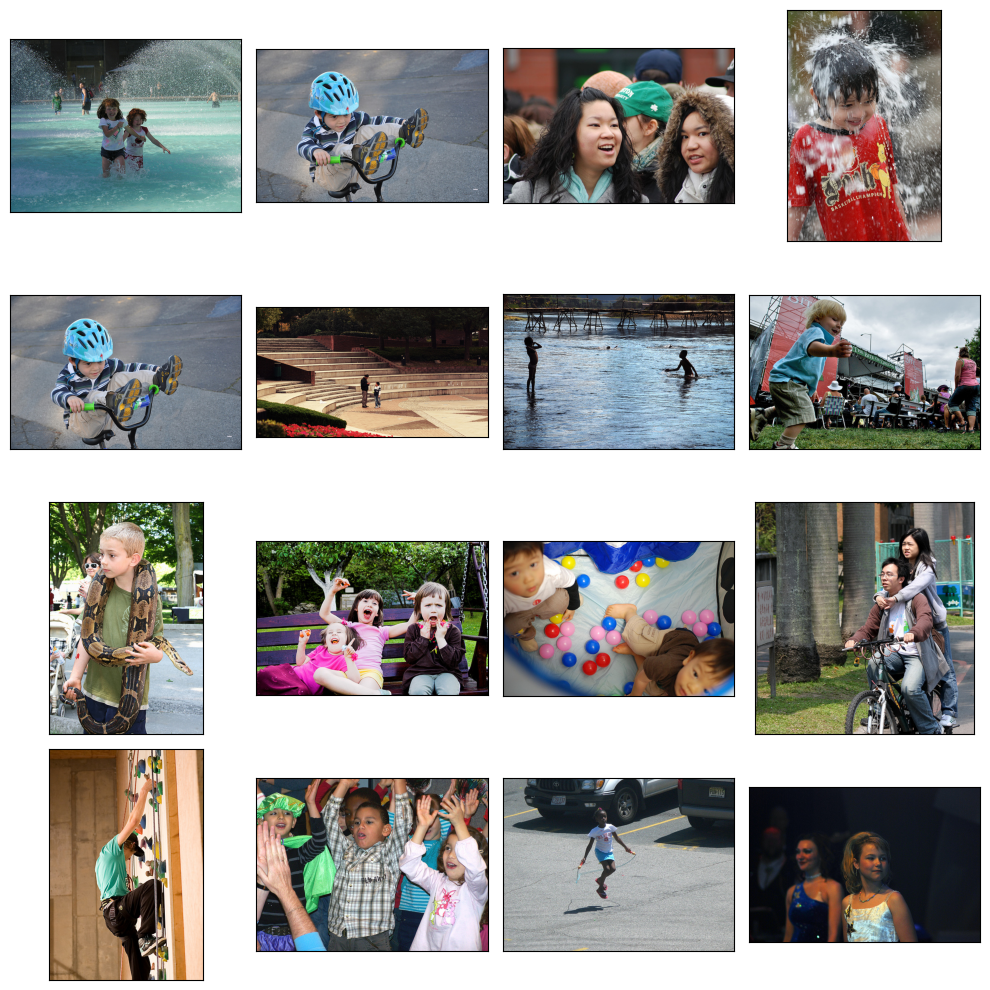

In [27]:
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Судя по всему, фотографии отобранны корректно, удалим их из набора данных

In [28]:
df_train.drop(df_train[df_train['to_block'] == 1].index, inplace=True, errors='ignore')
df_train.drop(columns='to_block', inplace=True, errors='ignore')
df_train.reset_index(inplace=True, drop=True)

In [29]:
display(df_train.head(), df_queries.head())
df_train.info()
print('-' * 100)
df_queries.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.333333
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.233333
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.333333
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36027 entries, 0 to 36026
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36027 non-null  object 
 1   query_id    36027 non-null  object 
 2   query_text  36027 non-null  object 
 3   score       36027 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


## Выводы

Произвели проверку данных на содержание запрещенных слов, очистили данные.

# Векторизация изображений

Для выделения главных компонентов изображений мы используем сверточные нейронные сети. Они хорошо подходят для анализа визуальной информации.

1. **Выбор архитектуры:**  
   Мы выбрали архитектуру ResNet-50, которая зарекомендовала себя как эффективная модель для анализа изображений.  

2. **Изменение модели:**  
   Рассмотрим структуру слоёв ResNet-50 и исключим полносвязные слои, предназначенные для конечного предсказания.  
   Для обучения мы используем предобученную модель ResNet-50, натренированную на датасете **ImageNet**.  

3. **Загрузка изображений:**  
   Создадим функции для загрузки изображений, чтобы подготовить данные к векторизации.  

In [30]:
def load_train(path=PATH) -> ImageDataGenerator:


    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)

    return train_gen_flow

Found 36027 validated image filenames.


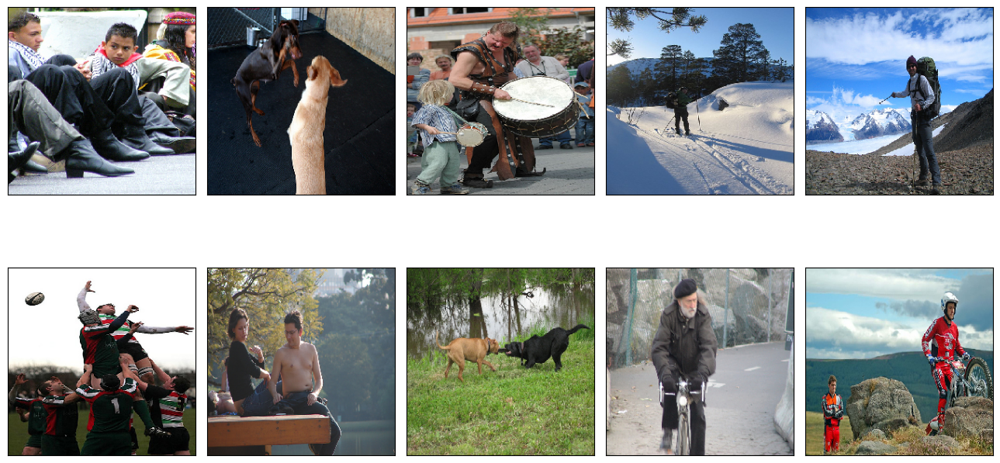

In [31]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

Создадим модель

In [32]:
def create_model(input_shape=(256, 256, 3)):


    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])

    return model

Сформируем эмбеддинги

In [33]:
def vectorize_pictures(model, train_data):


    predictions = model.predict(train_data)

    return predictions

In [34]:
pict_embeds = vectorize_pictures(create_model(), load_train())

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Found 36027 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2252/2252 ━━━━━━━━━━━━━━━━━━━━ 176s 76ms/step


In [35]:
pict_embeds.shape

(36027, 2048)

## Выводы

Эмбеддинги сформированы

# Векторизация текстов

Для векторизации тектов применим трансформер BERT из библиоетки Keras-NLP.


Для обработки текстов воспользуемся трансформером **BERT base cased** без классифицирующей головы. Эта модель отлично подходит для извлечения эмбеддингов текстов, так как предоставляет предобученные представления на уровне токенов и предложений.

In [36]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

In [37]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

Создадим функцию создания эмбеддингов из текстов

In [38]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:


    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):

            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]

            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types,
                    'padding_mask' : mask}

            batch_embeddings = model.predict(batch, verbose=verbose)

            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

Преобразуем тексты для передачи в функцию

In [39]:
text = list(df_train['query_text'])

Создадим эмбеддинги

In [40]:
text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1126 [00:00<?, ?it/s]

In [41]:
text_embeds.shape

(36027, 768)

## Выводы

1. Использована модель **BERT base cased EN** для генерации эмбеддингов текстов.  
2. Полученные эмбеддинги подготовлены для дальнейшего использования.  
3. Следующим шагом будет объединение эмбеддингов с другими признаками.  

# Объединение векторов

Объединим векторы изображений и векторы текстов с целевой переменной.

In [42]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(36027, 2816)

In [43]:
y = np.array(df_train['score'])
y.shape

(36027,)

In [44]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

## Выводы

Признаки и целевые переменные успешно подготовлены. Данные готовы для обучения моделей.  

# Обучение модели предсказания соответствия

Для обучения модели разделим датасет на тренировочную и валидационную выборки. Однако простое случайное разбиение не подходит, так как необходимо избежать ситуации, когда одно и то же изображение попадает одновременно в обе выборки.

Чтобы учесть уникальность изображений при разбиении, используем **класс GroupShuffleSplit** из библиотеки `sklearn.model_selection`. Этот метод позволяет учитывать группы (в данном случае — изображения) и гарантирует, что каждая группа будет присутствовать только в одной из выборок.

## Этапы разбиения:
1. **Идентификация групп:**  
   Определим, какие признаки или идентификаторы будут использоваться для группировки (например, идентификаторы изображений).  

2. **Разбиение данных:**  
   Используем `GroupShuffleSplit` для создания тренировочной и валидационной выборок.  

3. **Результат:**  
   Получим две выборки:
   - **Тренировочная:** для обучения модели.  
   - **Валидационная:** для оценки модели и предотвращения переобучения. 

In [45]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [46]:
X_train, X_test = X[train_indices], X[test_indices]

In [47]:
y_train, y_test = y[train_indices], y[test_indices]

In [48]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

## LinearRegression

Для оценки качества модели мы изначально рассматривали коэффициент детерминации **R²** (доля объяснённой дисперсии). Однако данный показатель оказался малоинформативным для нашей задачи.  

### Альтернативные метрики:
1. **MAPE (Mean Absolute Percentage Error):**  
   Хорошо измеряет относительную точность модели, но может давать завышенные значения, особенно если целевые значения близки к нулю. Эта метрика также более устойчива при большом разбросе целей.  

2. **MAE (Mean Absolute Error):**  
   Измеряет среднюю абсолютную ошибку, обеспечивая устойчивую оценку качества.  

3. **RMSE (Root Mean Squared Error):**  
   Реагирует сильнее на большие выбросы, так как разница между предсказанием и целью возводится в квадрат. Это может быть полезным в нашей задаче, если мы хотим уделить больше внимания значительным отклонениям.  

### Выбор метрики:
Мы решили остановиться на **RMSE**, так как она позволяет более явно учитывать влияние больших ошибок в предсказаниях. Это делает метрику наиболее подходящей для текущих задач.  

In [49]:
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)
score = cross_val_score(
    model, X_train, y_train, groups=df_train['image'].loc[train_indices],
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(random_state=SEED)
).mean()
abs(score).round(decimals=3)

0.223

## RandomForestRegressor

In [50]:
model = RandomForestRegressor(random_state=SEED, verbose=3)

param_grid = {
    'n_estimators':[5],
    'max_depth':[16]
}

gs_rfr = GridSearchCV(
    model,
    param_grid,
    n_jobs=1,
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(n_splits=3, random_state=SEED),
    verbose=3
)

In [51]:
gs_rfr.fit(X_train, y_train, groups=df_train['image'].loc[train_indices])

Fitting 3 folds for each of 1 candidates, totalling 3 fits
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 1/3] END .....max_depth=16, n_estimators=5;, score=-0.233 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 2/3] END .....max_depth=16, n_estimators=5;, score=-0.239 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 3/3] END .....max_depth=16, n_estimators=5;, score=-0.229 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5


GridSearchCV(cv=GroupShuffleSplit(n_splits=3, random_state=1940, test_size=None,
         train_size=None),
             estimator=RandomForestRegressor(random_state=1940, verbose=3),
             n_jobs=1, param_grid={'max_depth': [16], 'n_estimators': [5]},
             scoring='neg_root_mean_squared_error', verbose=3)

In [52]:
pd.DataFrame(gs_rfr.cv_results_)[['mean_test_score']].round(decimals=3)

,mean_test_score
0,-0.234


In [53]:
rfr_pred = gs_rfr.predict(X_test)
rfr_result = mean_absolute_error(y_test, rfr_pred).round(decimals=3)
rfr_result

0.137

## NeuralNetwork

In [54]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 2816)                │       7,932,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 2816)                │          11,264 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         721,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,666,369 (33.06 MB)

 Trainable params: 8,660,225 (33.04 MB)

 Non-trainable params: 6,144 (24.00 KB)

In [55]:
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )

Epoch 1/10
901/901 - 7s - 8ms/step - loss: 0.1882 - root_mean_squared_error: 0.4339 - val_loss: 0.1038 - val_root_mean_squared_error: 0.3221
Epoch 2/10
901/901 - 3s - 3ms/step - loss: 0.0671 - root_mean_squared_error: 0.2590 - val_loss: 0.0766 - val_root_mean_squared_error: 0.2768
Epoch 3/10
901/901 - 3s - 3ms/step - loss: 0.0446 - root_mean_squared_error: 0.2111 - val_loss: 0.0662 - val_root_mean_squared_error: 0.2573
Epoch 4/10
901/901 - 3s - 3ms/step - loss: 0.0369 - root_mean_squared_error: 0.1920 - val_loss: 0.0655 - val_root_mean_squared_error: 0.2559
Epoch 5/10
901/901 - 3s - 3ms/step - loss: 0.0352 - root_mean_squared_error: 0.1877 - val_loss: 0.0648 - val_root_mean_squared_error: 0.2546
Epoch 6/10
901/901 - 3s - 3ms/step - loss: 0.0346 - root_mean_squared_error: 0.1860 - val_loss: 0.0604 - val_root_mean_squared_error: 0.2457
Epoch 7/10
901/901 - 3s - 3ms/step - loss: 0.0347 - root_mean_squared_error: 0.1863 - val_loss: 0.0609 - val_root_mean_squared_error: 0.2467
Epoch 8/10
90

In [56]:
nn_pred = NN.predict(X_test)
nn_result = mean_absolute_error(y_test, nn_pred).round(decimals=3)
nn_result

225/225 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


0.105

In [57]:
result_dict = {'model':['LinearRegression',
                        'RandomForestRegressor',
                        'NN'],
               'score':[score*-1,
                        rfr_result,
                        nn_result
                       ]
              }
df_results = pd.DataFrame(result_dict)
df_results

,model,score
0,LinearRegression,0.222528
1,RandomForestRegressor,0.137000
2,NN,0.105000


## Выводы

Наилучший результат показала нейронная сеть

# Тестирование модели

Настало время протестировать модель.

Для этого получим эмбеддинги для всех тестовых изображений из папки test_images, выберем случайные 10 запросов из файла test_queries.csv и для каждого запроса выведем наиболее релевантное изображение.

Сравним визуально качество поиска.

Сделаем загрузчик изображений

In [58]:
def load_test(path=PATH) -> ImageDataGenerator:


    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)

    return train_gen_flow

Создадим эмбеддинги

In [59]:
pict_embeds_test = vectorize_pictures(create_model(), load_test())
pict_embeds_test.shape

Found 100 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 689ms/step


(100, 2048)

In [60]:
def get_picture(text) -> None:

    if [i for i in get_lemmas(text) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None

In [61]:
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['Two dogs are wrestling in the park .',
 'A young boy is feeding a horse some hay from an orange bucket .',
 'Several dogs are running through the dirt .',
 'A man with something orange on his helmet riding a bike in a busy setting .',
 'A gray bird is flying over the water .',
 'A group of people playing instruments in the woods .',
 'Two boys playing in water .',
 'A young boy jumps off a rock in the forest',
 'The dog jumps up to catch the red ball .',
 'Two dogs are wrestling in a field .']

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

-------------------- Two dogs are wrestling in the park . --------------------



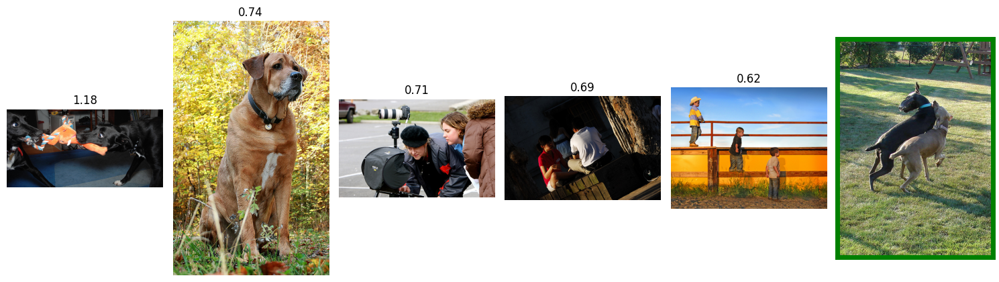


-------------------- A young boy is feeding a horse some hay from an orange bucket . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- Several dogs are running through the dirt . --------------------



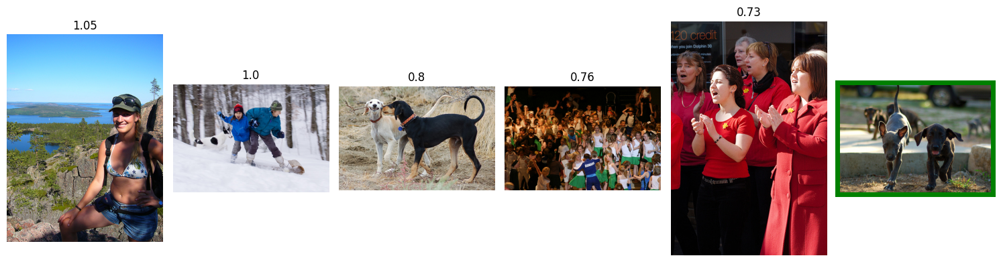

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- A man with something orange on his helmet riding a bike in a busy setting . --------------------



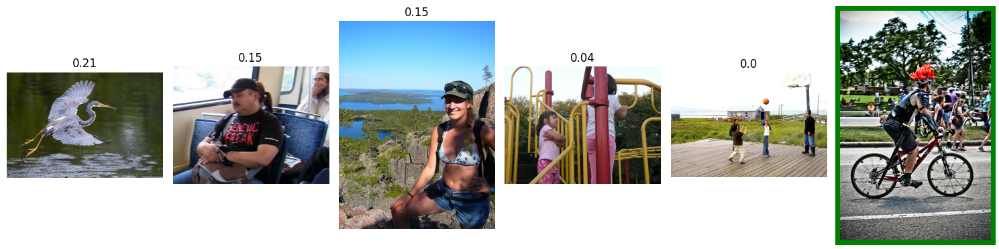

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- A gray bird is flying over the water . --------------------



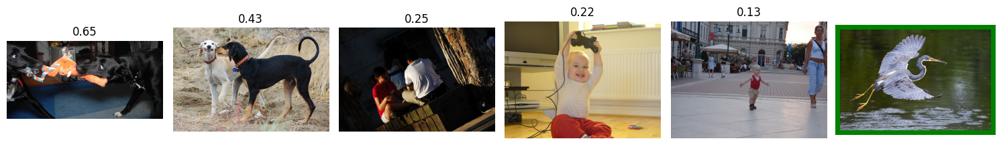

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- A group of people playing instruments in the woods . --------------------



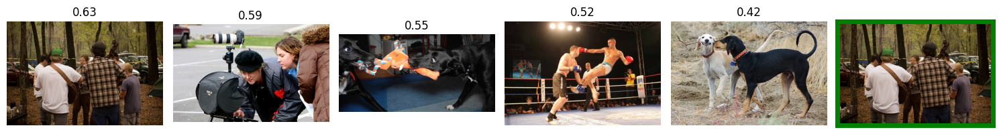


-------------------- Two boys playing in water . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A young boy jumps off a rock in the forest --------------------

This image is unavailable in your country in compliance with local laws.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- The dog jumps up to catch the red ball . --------------------



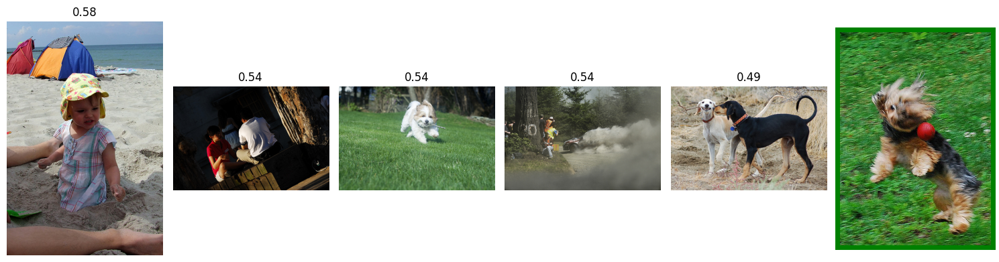

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

-------------------- Two dogs are wrestling in a field . --------------------



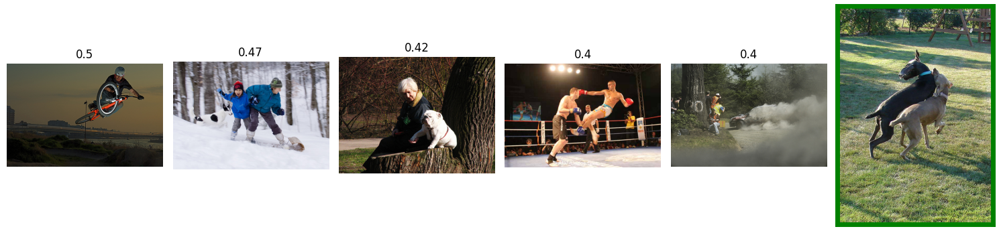

In [62]:
for text in text_test:
    get_picture(text)

In [63]:
requests = ['multiple trees',
            'dog is playing',
            'We do business around the world',
            'man in the park',
            'hollidays'
           ]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- multiple trees --------------------



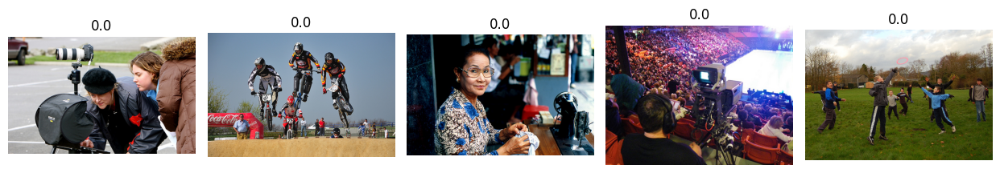

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- dog is playing --------------------



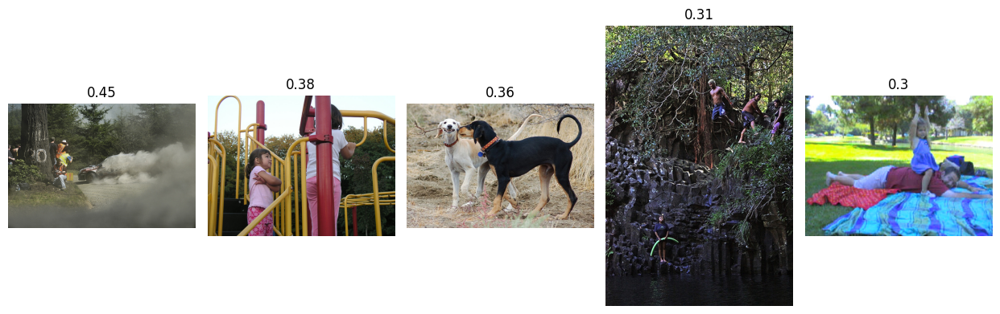

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- We do business around the world --------------------



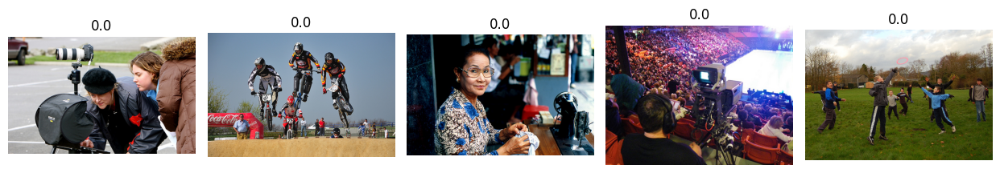

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- man in the park --------------------



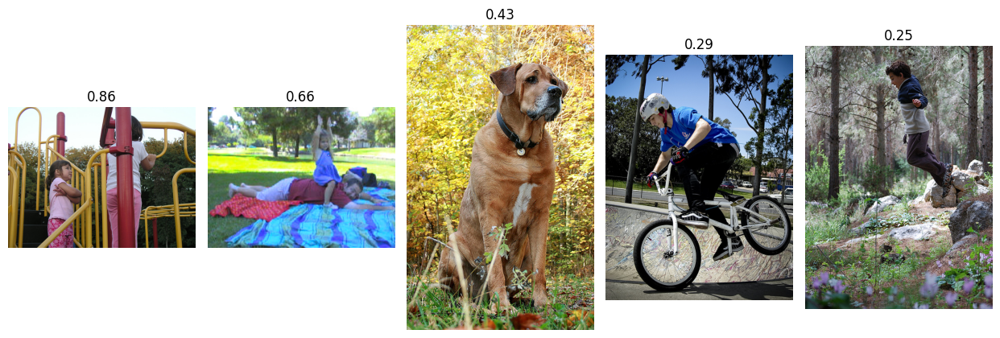

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- hollidays --------------------



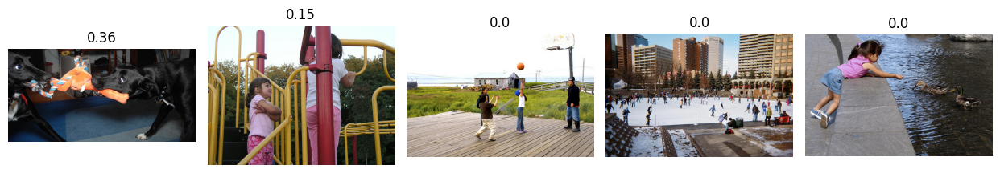

In [64]:
for text in requests:
    get_picture(text)

# Заключение

В рамках данного проекта был разработан MVP системы поиска изображений по фотографии.

**Основные этапы работы:**
- Для векторизации изображений применена нейросеть **ResNet-50**.  
- Для получения текстовых эмбеддингов использован трансформер **BERT base cased EN**.  
- После объединения признаков и выделения целевых переменных (экспертных оценок сходства между описаниями и изображениями) было протестировано три модели оценки соответствия:
  1. **LinearRegression**
  2. **RandomForestRegressor**
  3. **Нейронная сеть**

Наилучшую точность показала нейронная сеть, которая и была использована для итогового тестирования.

**Тестирование:**
В ходе проверки была реализована функция, возвращающая 5 наиболее подходящих под описание изображений. Тестирование проводилось как на уже имеющихся описаниях, так и на случайных фразах.

**Результаты:**
К сожалению, MVP продемонстрировал низкую стабильность в плане релевантности результатов. В отдельных случаях верное изображение действительно попадало в выдачу, а иногда удавалось получить лишь тематически близкие картинки. Возможно, предоставленного набора данных оказалось недостаточно для надёжного поиска дополнительного, схожего с описанием изображения.

Для улучшения результатов следует рассмотреть расширение доступного датасета, как в части обучения, так и в части тестирования. Более объёмный и разнообразный набор данных мог бы повысить устойчивость и релевантность итоговой модели.  